# Using GPU and Authors repo Notebook
## MLA Project - Fader Networks

**Authors:** Adrien PETARD, Robin LEVEQUE, Théo MAGOUDI, Eliot CHRISTON

**Group:** 11


How to connect to the jupyter server and vscode, and how to use/understand it:

On this link you will find all the instructions to complete the quest of connecting your notebook to the university's server: https://code.visualstudio.com/docs/datascience/jupyter-notebooks

But to help you I will resume the steps you will go through:
- Click on the kernel you're actually using on the top right corner of the vscode window
- Click with the left click of your mouse adnd then choose "Select another kernel"
And then enter all the informations needed:
URL:    https://sdi.ppi.ingenierie.upmc.fr/gpu11
ID:     notregroupe
PWD:    notregroupe



When you are on Vscode and you create a notebook, you have the option to choose a server to which you will connect. Here, the advantage is to connect to the university server to have access to the images without downloading them, and that on our favorite environment. We can then create our notebooks or even Python files that will be executed by the notebook which is relatively educational and allows improving the communication of information and progress.


In [ ]:
# By using the % or ! before a command that we would usually use in the terminal, we can execute it directly in the notebook:
%cd
!ls
%ls

# Now we will get the files we are interested in:
%cd tests/MLA_Projet_2023/
%ls

/home/notregroupe
README.md  data  shared  tests


README.md  data@  shared@  tests/
/home/notregroupe/tests/MLA_Projet_2023
AutoEncoder.py            Ressources.md           network_architectures.py
CR/                       __pycache__/            objectives.py
Discriminator.py          data/                   result_batch1.png
FaderNetworks_NIPS2017/   data_exploration.ipynb  result_batch9.png
Logs/                     data_loader_V1.py       results/
MLA_Projet_Article-1.pdf  data_loader_V2.py       script/
README.md                 data_loader_V3.py       training_loop.py


In [226]:
# We will now begin to preprocess the images, that is to say...:
# 1. Download the images
# 2. Resize them

%cd
%ls
print("\nstart point:")
%cd tests/MLA_Projet_2023/FaderNetworks_NIPS2017/
%ls
# Check that we are in the right file

print("\nthe datas we are going to use for this part:")
%cd data
%ls

# DECOMMENT THIS PART IF YOU NEED TO DOWNLOAD PREPROCESSED DATA
# !chmod +x preprocess.py # We need to make the file executable and give it the right to be executed
# !./preprocess.py

# We have in VScode the file preprocess.py, we will use it to preprocess the images:

# It will resize images, and create 2 files: images_256_256.pth and attributes.pth.
# The first one contains a tensor of size (202599, 3, 256, 256) containing the concatenation of all resized images. Note that you can update the image size in preprocess.py to work with different resolutions.
# The second file is a pre-processed version of the attributes.

/home/notregroupe
README.md  data@  shared@  tests/

start point:
/home/notregroupe/tests/MLA_Projet_2023/FaderNetworks_NIPS2017
FaderNetworks_NIPS2017.ipynb  data/           male.png         src/
LICENSE                       eyeglasses.png  models/          train.py
README.md                     images/         narrow_eyes.png  young.png
classifier.py*                interpolate.py  pointy_nose.png

the datas we are going to use for this part:
/home/notregroupe/tests/MLA_Projet_2023/FaderNetworks_NIPS2017/data
CelebA.png  attributes.pth      images_256_256_20000.pth  list_attr_celeba.txt
Img_lite/   images_256_256.pth  img_align_celeba/         preprocess.py*


## We are going to train our own model 



In [227]:
%cd
%cd tests/MLA_Projet_2023/FaderNetworks_NIPS2017/models
%ls

# DECOMMENT THIS PART IF YOU WANT TO DOWNLOAD THE PRETRAINED MODELS
# !chmod +x download.sh
# !./download.sh

/home/notregroupe
/home/notregroupe/tests/MLA_Projet_2023/FaderNetworks_NIPS2017/models
classifier128.pth  default/      eyeglasses.pth  narrow_eyes.pth  young.pth
classifier256.pth  download.sh*  male.pth        pointy_nose.pth


Given a trained model, you can use it to swap attributes of images in the dataset. Below are examples using the pretrained models:

In [228]:
%cd
%cd tests/MLA_Projet_2023/FaderNetworks_NIPS2017/

/home/notregroupe
/home/notregroupe/tests/MLA_Projet_2023/FaderNetworks_NIPS2017


In [229]:
if input("Do you want to download the pretrained models? (yes/no)") == "yes":
    !chmod +x download.sh
    !./download.sh

if input("Do you want to preprocess the images? (yes/no)") == "yes":
    # Narrow Eyes
    !python interpolate.py --model_path models/narrow_eyes.pth --n_images 10 --n_interpolations 10 --alpha_min 10.0 --alpha_max 10.0 --output_path narrow_eyes.png

    # Eyeglasses
    !python interpolate.py --model_path models/eyeglasses.pth --n_images 10 --n_interpolations 10 --alpha_min 2.0 --alpha_max 2.0 --output_path eyeglasses.png

    # Age
    !python interpolate.py --model_path models/young.pth --n_images 10 --n_interpolations 10 --alpha_min 10.0 --alpha_max 10.0 --output_path young.png

    # Gender
    !python interpolate.py --model_path models/male.pth --n_images 10 --n_interpolations 10 --alpha_min 2.0 --alpha_max 2.0 --output_path male.png

    # Pointy nose
    !python interpolate.py --model_path models/pointy_nose.pth --n_images 10 --n_interpolations 10 --alpha_min 10.0 --alpha_max 10.0 --output_path pointy_nose.png

/usr/local/lib/python3.10/dist-packages/torch/serialization.py:868: SourceChangeWarning: source code of class 'torch.nn.modules.container.ModuleList' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.10/dist-packages/torch/serialization.py:868: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.10/dist-packages/torch/serialization.py:868: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute

/home/notregroupe
/home/notregroupe/tests/MLA_Projet_2023/FaderNetworks_NIPS2017


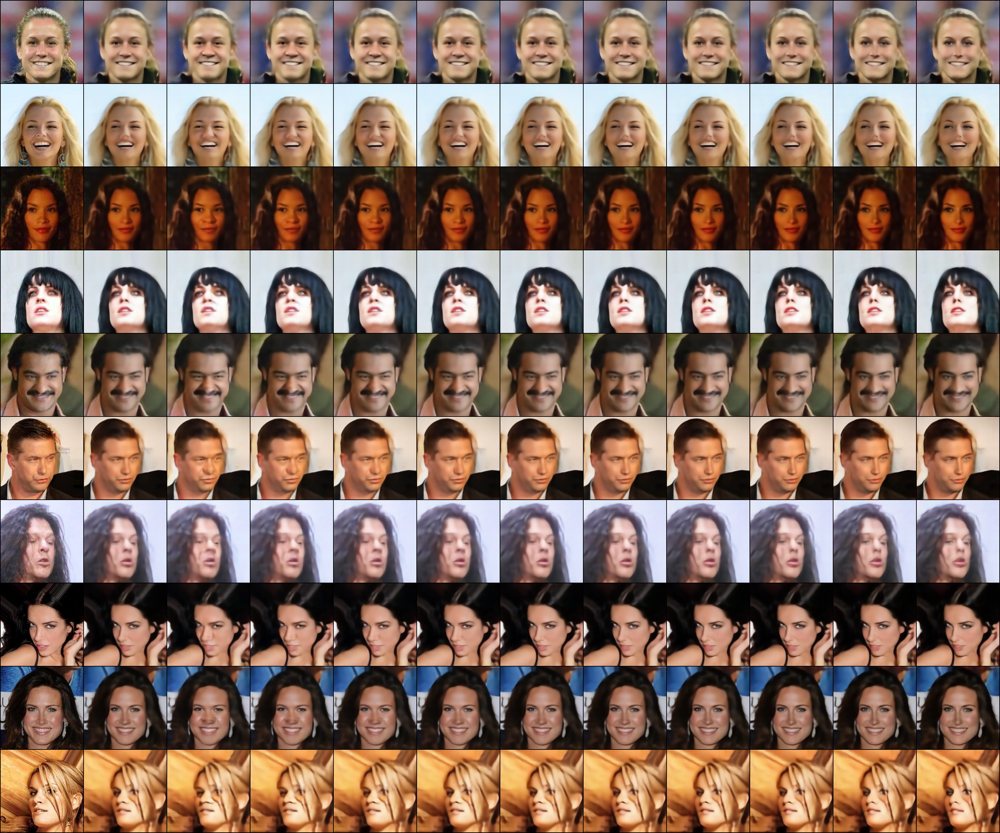

In [230]:
%cd
%cd tests/MLA_Projet_2023/FaderNetworks_NIPS2017/
# Narrow Eyes
from IPython.display import Image
Image(filename='narrow_eyes.png')

# Eyeglasses
Image(filename='eyeglasses.png')

# Age
Image(filename='young.png')

# Male
Image(filename='male.png')

# Pointy nose
Image(filename='pointy_nose.png')

These commands will generate images with 10 rows of 12 columns with the interpolated images. The first column corresponds to the original image, the second is the reconstructed image (without alteration of the attribute), and the remaining ones correspond to the interpolated images. alpha_min and alpha_max represent the range of the interpolation. Values superior to 1 represent generations over the True / False range of the boolean attribute in the model. Note that the variations of some attributes may only be noticeable for high values of alphas. For instance, for the "eyeglasses" or "gender" attributes, alpha_max=2 is usually enough, while for the "age" or "narrow eyes" attributes, it is better to go up to alpha_max=10.

## Train your own models

### Train a classifier
To train your own model you first need to train a classifier to let the model evaluate the swap quality during the training. Training a good classifier is relatively simple for most attributes, and a good model can be trained in a few minutes. We provide a trained classifier for all attributes in models/classifier256.pth. Note that the classifier does not need to be state-of-the-art, it is not used during the training process, but is just here to monitor the swap quality. If you want to train your own classifier, you can run classifier.py, using the following parameters:

In [231]:
# DECOMMENT THIS PART TO USE THE CLASSIFIER
if input("Do you want to use the classifier? (yes/no)") == "yes":
    %cd
    %cd tests/MLA_Projet_2023/FaderNetworks_NIPS2017/
    !chmod +x classifier.py
    !python classifier.py

# Main parameters
--img_sz 256                  # image size
--img_fm 3                    # number of feature maps
--attr "*"                    # attributes list. "*" for all attributes

# Network architecture
--init_fm 32                  # number of feature maps in the first layer
--max_fm 512                  # maximum number of feature maps
--hid_dim 512                 # hidden layer size

# Training parameters
--v_flip False                # randomly flip images vertically (data augmentation)
--h_flip True                 # randomly flip images horizontally (data augmentation)
--batch_size 32               # batch size
--optimizer "adam,lr=0.0002"  # optimizer
--clip_grad_norm 5            # clip gradient L2 norm
--n_epochs 1000               # number of epochs
--epoch_size 50000            # number of images per epoch

# Reload
--reload ""                   # reload a trained classifier
--debug False                 # debug mode (if True, load a small subset of the dataset)

### Train a Fader Network
You can train a Fader Network with train.py. The autoencoder can receive feedback from:

The image reconstruction loss
The latent discriminator loss
The PatchGAN discriminator loss
The classifier loss
In the paper, only the first two losses are used, but the two others could improve the results further. You can tune the impact of each of these losses with the lambda_ae, lambda_lat_dis, lambda_ptc_dis, and lambda_clf_dis coefficients. Below is a complete list of all parameters:

In [232]:
# DECOMMENT THIS PART TO USE THE 
if input("Do you want to train the model? (yes/no)") == "yes":
    %cd
    %cd tests/MLA_Projet_2023/FaderNetworks_NIPS2017/
    !chmod +x train.py
    !python train.py

# Main parameters
--img_sz 256                      # image size
--img_fm 3                        # number of feature maps
--attr "Male"                     # attributes list. "*" for all attributes

# Networks architecture
--instance_norm False             # use instance normalization instead of batch normalization
--init_fm 32                      # number of feature maps in the first layer
--max_fm 512                      # maximum number of feature maps
--n_layers 6                      # number of layers in the encoder / decoder
--n_skip 0                        # number of skip connections
--deconv_method "convtranspose"   # deconvolution method
--hid_dim 512                     # hidden layer size
--dec_dropout 0                   # dropout in the decoder
--lat_dis_dropout 0.3             # dropout in the latent discriminator

# Training parameters
--n_lat_dis 1                     # number of latent discriminator training steps
--n_ptc_dis 0                     # number of PatchGAN discriminator training steps
--n_clf_dis 0                     # number of classifier training steps
--smooth_label 0.2                # smooth discriminator labels
--lambda_ae 1                     # autoencoder loss coefficient
--lambda_lat_dis 0.0001           # latent discriminator loss coefficient
--lambda_ptc_dis 0                # PatchGAN discriminator loss coefficient
--lambda_clf_dis 0                # classifier loss coefficient
--lambda_schedule 500000          # lambda scheduling (0 to disable)
--v_flip False                    # randomly flip images vertically (data augmentation)
--h_flip True                     # randomly flip images horizontally (data augmentation)
--batch_size 32                   # batch size
--ae_optimizer "adam,lr=0.0002"   # autoencoder optimizer
--dis_optimizer "adam,lr=0.0002"  # discriminator optimizer
--clip_grad_norm 5                # clip gradient L2 norm
--n_epochs 1000                   # number of epochs
--epoch_size 50000                # number of images per epoch

# Reload
--ae_reload ""                    # reload pretrained autoencoder
--lat_dis_reload ""               # reload pretrained latent discriminator
--ptc_dis_reload ""               # reload pretrained PatchGAN discriminator
--clf_dis_reload ""               # reload pretrained classifier
--eval_clf ""                     # evaluation classifier (trained with classifier.py)
--debug False                     # debug mode (if True, load a small subset of the dataset)